## Chapter 11: Principles of Feature Learning

# 11.4 Efficient cross-validation via regularization

In the previous Section we introduced our first general paradigm for effective cross-validation called boosting, with which we took a 'bottom-up' approach to fine tuning the proper amount of capacity a model needs. In other words, we began with a *low capacity* model and then gradually increased its capacity by adding additional units (from the same family of universal approximators) in our search for the proper capacity (i.e., one that minimizes validation error).

In this Section we introduce the complementary 'top-down' approach for effective cross-validation, called *regularization*. With this approach, we start off with a very high capacity model (one which would likely overfit, providing a low training error but high validation error) and gradually *decrease* or *block* its capacity until we find the proper capacity (at which the validation error is minimized).

In [1]:
## This code cell will not be shown in the HTML version of this notebook
# imports from custom library
import sys
sys.path.append('../../')
from mlrefined_libraries import math_optimization_library as optlib
from mlrefined_libraries import nonlinear_superlearn_library as nonlib
from mlrefined_libraries import basics_library 

# demos for this notebook
regress_plotter = nonlib.nonlinear_regression_demos_multiple_panels
classif_plotter = nonlib.nonlinear_classification_visualizer_multiple_panels
static_plotter = optlib.static_plotter.Visualizer()
basic_runner = nonlib.basic_runner
classif_plotter_crossval = nonlib.crossval_classification_visualizer
datapath = '../../mlrefined_datasets/nonlinear_superlearn_datasets/'

# import autograd functionality to bulid function's properly for optimizers
import autograd.numpy as np

# import timer
from datetime import datetime 
import copy
import math
import pickle

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

## 11.3.1  Overfitting and proper the optimization of high capacity models

Imagine for a moment that we have a simple nonlinear regression dataset, like the one shown in the left panel of the Figure below, and we use a single model - made up of a sum of *universal approximators* of a given type - with far too much capacity to try to fit this data properly.  In other words, we train our high capacity model on a training portion of this data via minimization of an appropriate cost function like e.g., the Least Squares cost.  In the left panel we also show a corresponding fit provided by our overfitting model in red, which wildly overfits the data.  

<figure>
<img src="../../mlrefined_images/nonlinear_superlearn_images/overfitting_part_1.png" width="100%" height="auto"/>
<figcaption> <strong>Figure 1:</strong> <em> (left panel) A generic nonlinear regression dataset, along with a high capacity model overfitting its training portion (with the fit shown in red).  (right panel) A *figurative illustration* of the cost function associated to this model (i.e., we show it as a taking in only a single input for visualization purposes only).  Here the set of parameters associated with our overfitting model are those near the minimum of this cost, highlighted here with a red dot.  </em>
</figcaption>
</figure>

In a high capacity model like this one we have clearly used too many and/or too flexible *universal approximators* (feature transformations).  Equally important to diagnosing the problem of overfitting is *how well we tune our model's parameters* or - in other words - *how well we minimize its corresponding cost function*.  In the present case for example, the parameter setting of our model in the middle panel that overfits our training data came from near the minimum of the model's cost function.  This cost function is drawn figuratively in the right panel, where the minimum is shown as a red point.  This is true in general with all high capacity models - regardless of the kind / how many feature transformations we use - a model will overfit a training set *only when we tune its parameters well* or, in other words, *when we minimize its corresponding cost function well*.  Conversely, even if we use a high capacity model, if we do *not* tune its parameters *perfectly* a model will not overfit its training data.  

<figure>
<img src="../../mlrefined_images/nonlinear_superlearn_images/overfitting_part_2.png" width="120%" height="auto"/>
<figcaption> <strong>Figure 2:</strong> <em> A version of the previous Figure, only now we show the result of two fits.  Our (training-set) overfit is shown once again in red in the left panel, and the evaluation of these parameters via the associated cost function is shown figuratively in the right panel as a red dot.  Here however we also show a second fit in blue provided by a set of weights that are not near the global minimum of the cost, with their evaluation via the cost shown as a blue dot in the right panel.  Because these parameters do not minimize the cost function they do not overfit the training data, and provide a better representation of the overall dataset.
</em>
</figcaption>
</figure>

## 11.4.2  Regularization based cross-validation: the big picture

The general set of *regularization* procedures for cross-validation can be thought of as a direct product of the insight highlighted above: if proper optimization of a high capacity model leads to overfitting, it can be avoided by optimizing said model *imperfectly*.  In other words *regularization* is an approach to cross-validation wherein we carefully tune the parameters of a high capacity model by *setting its them purposfully away from the global minima of its associated cost function*.  This can be done in a variety of ways, but one of the most popular approaches employs exactly the *regularizer* concept we have seen throughout the text.  As we have seen previously, a regularizer is a simple function that can be added to a machine learning cost for a variety of purposes e.g., to prevent unstable learning (as we saw in Section 6.3), as a natural part of relaxing the support vector machine (Section 6.4) and multi-class learning scenarios (Section 7.1-7.2), and for feature selection (Section 9.4).  As we will see, latter of these applications (feature selection) is very similar to our use of regularizers here.  

By adding a regularizer to a high capacity model we *change the shape of its associated cost function and - in particular - change the location of its global minima*.  Since the global minima of the adjusted cost function do not align with those of the original cost, the adjusted cost can then be completely minimized with less fear of overfitting occuring on the training data.   This effect is illustrated figuratively in the animation below.  In the left panel we show a prototypical single input cost function $g(w)$, in the middle panel is shown a simple function we will add to it (here a quadratic $w^2$) and in the right panel we show their linear combination $g(w) + \lambda w^2$.  As we increase $\lambda > 0$ (moving the slider left to right) notice how the cost's single global minimum - the minimum evaluation is shown as a red dot and the corresponding input $w$ is shown as a red 'x' - moves.  As more and more of the quadratic is added to the original cost function its minimum - shown as a green dot and corresponding input shown as a green 'x' - moves away from the original.


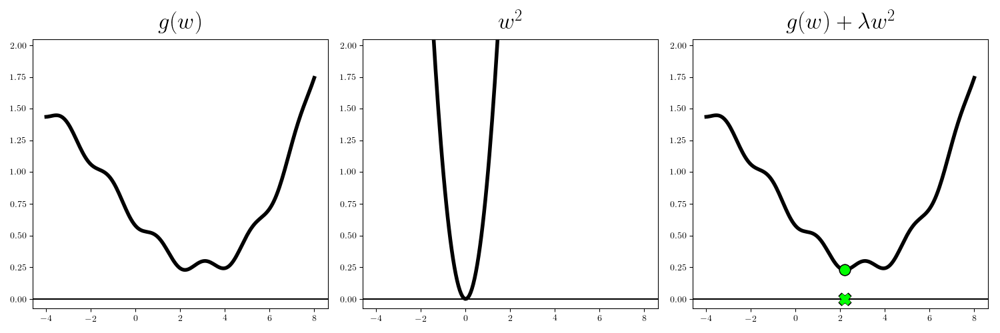
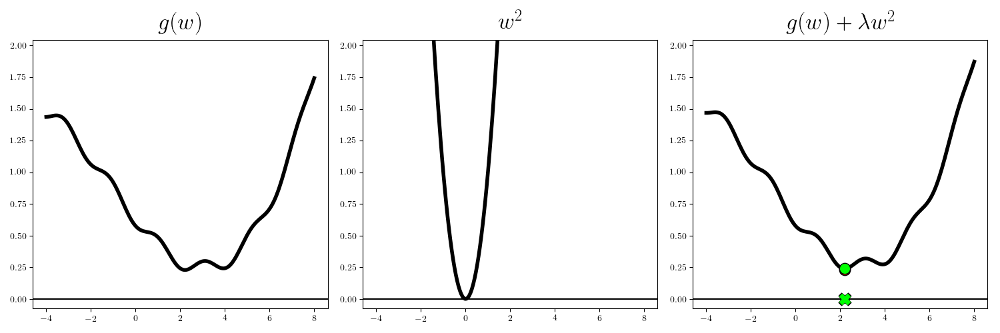
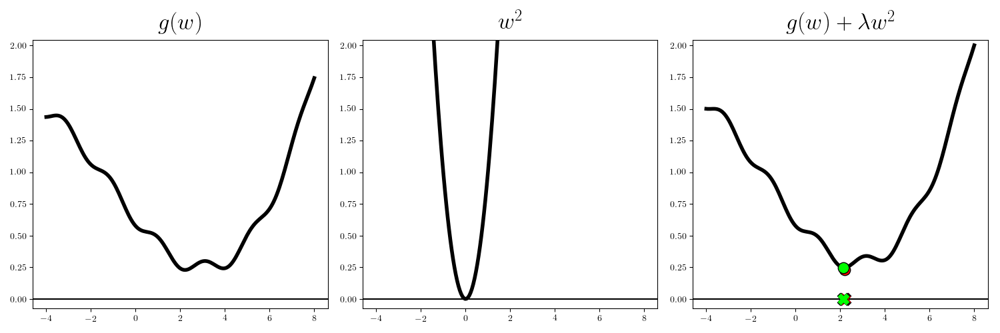
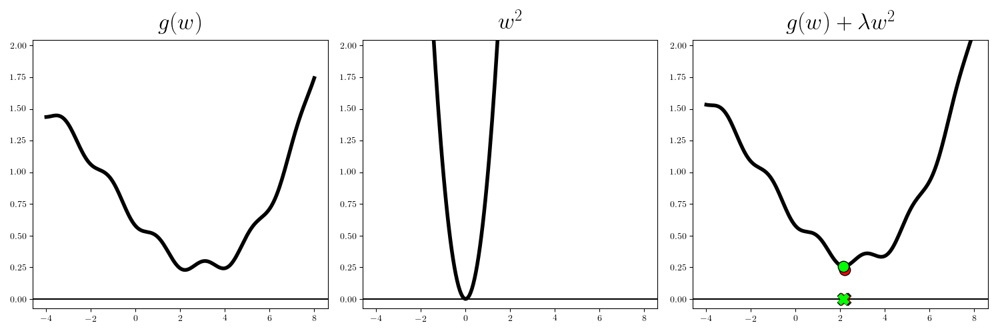
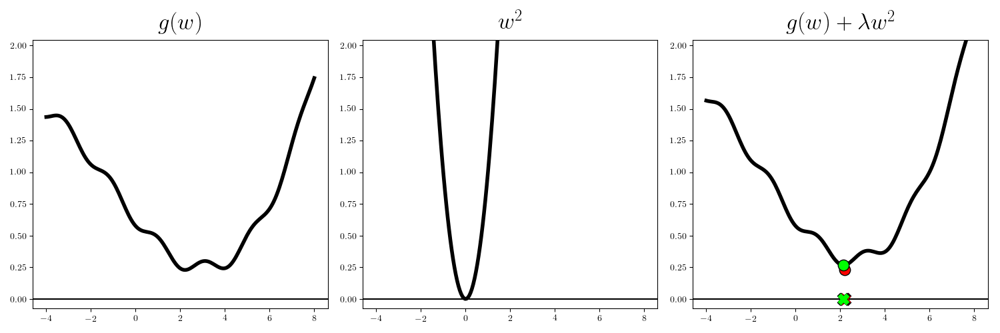
...
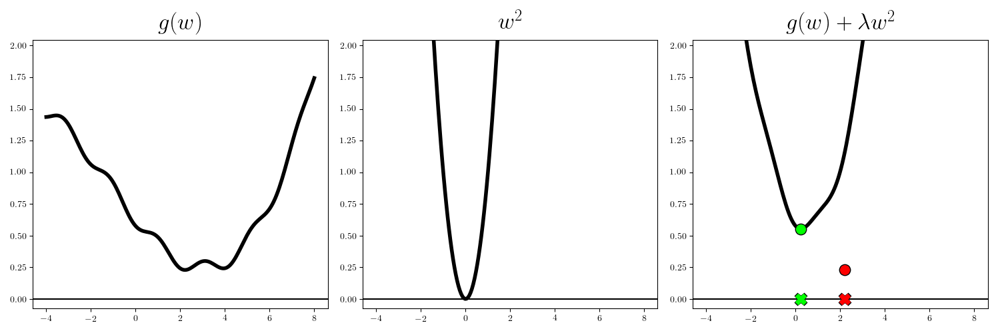
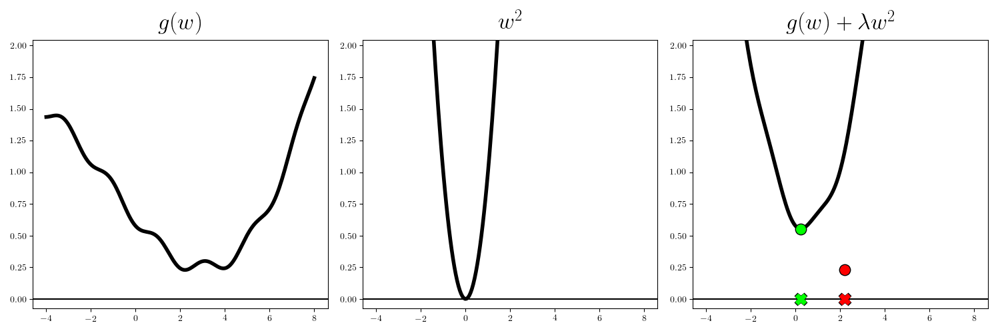
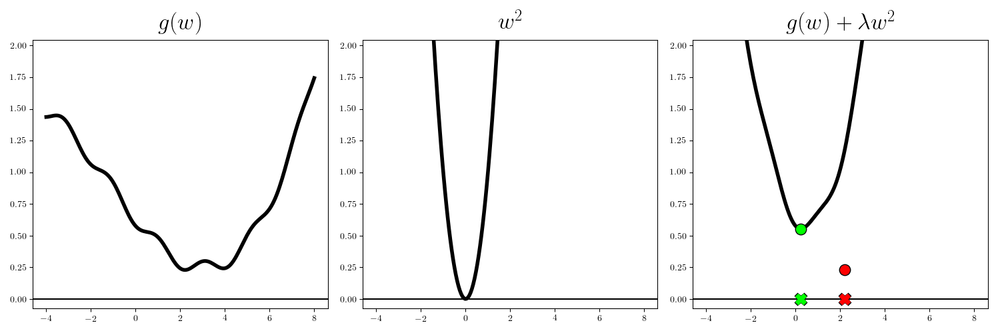
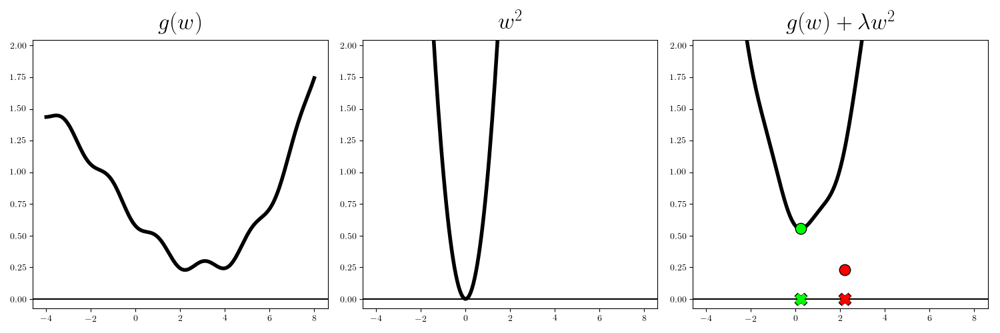
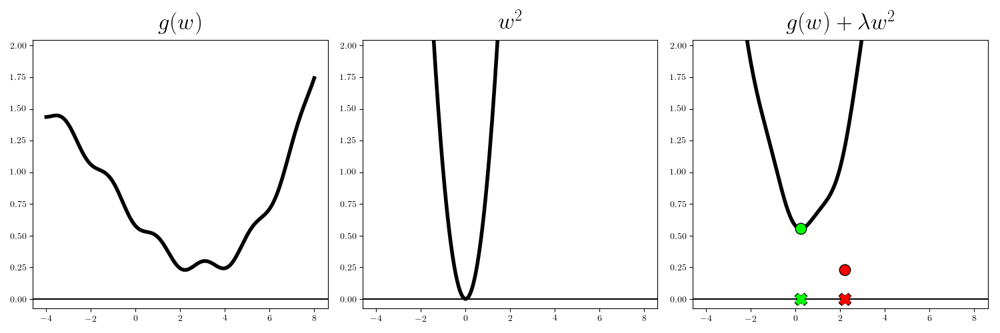

In [39]:
# This code cell will not be shown in the HTML version of this notebook
# what function should we play with?  Defined in the next line.
g1 = lambda w:  (w - 0.5)**2 
g1 = lambda w: np.sin(3*w) + 0.1*w**2 - 0.7
g2 = lambda w: w**2

# create an instance of the visualizer with this function
test = basics_library.convex_function_addition_2d_min_highlight.visualizer()

# plot away
test.draw_it(g1 = g1,g2 = g2,num_frames = 100,min_range = -4,max_range = 8, alpha_range=(0,0.2),title1 = '$g(w)$',title2 = '$w^2$', title3='$g(w) + \\lambda w^2$')

A complete minimization of the cost function plus the simple addition - for any value of $\lambda > 0$ -  will not reach the global minimum of the original cost, and overfitting is prevented provided $\lambda$ is set large enough.  On the other hand, in making sure $\lambda$ is not set too large (or else the cost function itself is completely drowned out by the simple function we added to it, and then we are essentially just minimizing the simple function alone) the sum still somewhat resembles the original function, and its global minimum will lie 'close enough' to the original cost's that the weight $w$ it provides enables a good fit to a corresponding dataset.  This general idea is shown figuratively below.  By *regularizing* the original cost function in this way we can - upon proper minimization of this regularized cost - find weights that lie just the right distance from the global minima of the original cost function, which when used with our original model produces just the right capacity to provide a good fit.

<figure>
<img src="../../mlrefined_images/nonlinear_superlearn_images/regularization_cross_validation.png" width="80%" height="auto"/>
<figcaption> <strong>Figure 4:</strong> <em>  </em>
A prototypical cost function $g(w)$ - shown in blue - of a high capacity model.  Points near the global minimum of the cost will produce overfitting, while points too far away from the global minimum will tend to produce underfitting.  To find weights in-between these two undesirable extremes we can add a simple function to this cost - here the weighted quadratic $\lambda w^2$ - changing the location of the cost function's global minimum.  By setting the value of $\lambda \geq 0$ properly and by completely minimizing the sum $g(w) + \lambda w^2$ we can find a weight that provides a good fit when employed by our high capacity model.
</figcaption>
</figure>

Using the dial visualization of cross-validation introduced in Section 11.2.2 we can think about the regularization procedures as starting with the dial set *all the way to the right* (at a model with extremely high capacity).  We then look to move our model's parameters *away from the global minima of its associated cost function by trying out a range of increasing values for $\lambda$ starting with $\lambda = 0$*.  As we *increase* $\lambda$ we turn our cross-validation dial *counter-clockwise* from right to left, decreasing the capacity of the final model in search of a model with low validation error - **the best choice of $\lambda$ is the one that provides minimal validation error.**

<figure>
<img src= '../../mlrefined_images/nonlinear_superlearn_images/regularization_dial.png' width="100%"/>
</figure>

<figure>
 <figcaption> <strong>Figure 3:</strong> <em> 
With regularization we begin with our cross-validation dial set all the way to the right - at an extremely high capacity model - and gradually decrease model capacity sequentially.   As regularization progresses we slowly turn the dial counter-clockwise from right to left, gradually decreasing the model's capacity, in search of a model with minimum validation.
</em>
</figcaption>
</figure>

Akin to what we saw with boosting in the prior Section, with regularization we want to perform our search as carefully as possible, turning our cross-validation dial as smoothly from right to left in search of our perfect model.  This desire translates directly to the resolution of values for $\lambda$ that we test out - the higher the resolution (the more values we try) the smoother we turn our cross-validation dial from right to left.  The limit on how many values we can try is often limited by computation and time restrictions, since **for every value of $\lambda$ tried a *complete minimization of a corresponding regularized cost function must be performed**.  This can make regularization based cross-validation very computationally expensive.

<figure>
    <img src= '../../mlrefined_images/nonlinear_superlearn_images/jerky.png' width="100%"/>
</figure>

##  11.4.3  The general regularization scheme

With regularization techniques we once again use a model of the standard form

\begin{equation}
\text{model}\left(\mathbf{x},\Theta\right) = w_0 + f_1\left(\mathbf{x}\right){w}_{1} +  f_2\left(\mathbf{x}\right){w}_{2} + \cdots + f_B\left(\mathbf{x}\right)w_B
\end{equation}

where each unit $f_b$ comes from a single family of universal approximators.  The high capacity model we begin with - whether we use a kernel, neural network, or tree-based approximator - should in general consist of a large number of units and / or units with *high capacity*.   While there is no universal rule for how many / how high capacity units to use for every dataset, in general we want our model to be high capacity enough so that when its parameters are tuned optimally we overfit the training data.  Families of each universal approximator type consisting of high capacity units - e.g., deep neural networks and trees - are described in detail in the three Chapters following this one.  In practice regularization is very often used as the cross-validation approach of choice when employing either kernel and neural network universal approximators.  As we will see another common choice of regularization with neural networks is called *early stopping*, which is described later in Section 13.5.

As we have seen with virtually all previous applications of regularization in the past - here too we regularize only *non-bias* weights.  Suppose - for example - that we employ kernel units and hence $\Theta$ contains a single bias $w_0$ and feature-touching weights $w_1,\,w_2,\,...,w_B$.  If we then regularize our cost function $g\left(\mathbf{w}\right)$ using the squared $\ell_2$ norm our regularized cost would then take precisely the form we have seen in e.g., 9.6.2, that is

\begin{equation}
g\left(\mathbf{w}\right) + \lambda \sum_{b=1}^Bw_b^2
\end{equation}

When employing neural network units follow the same pattern, but here we have far more bias terms to avoid regularizing.  For example if we used single hidden layer units of the form $f_b\left(\mathbf{x}\right) = \text{tanh}\left(w_{b,0} + w_{b,1}x_1 + \cdots + w_{b,\,N}x_N\right)$ the term $w_{b,0}$ - internal to the unit - is a bias term we also do not want included in our regularizer.  Thus to regularize a cost function including these units $g\left(\Theta\right)$ using the squared $\ell_2$ norm we have

\begin{equation}
g\left(\Theta\right) + \lambda \sum_{b=1}^Bw_b^2 + \sum_{b=1}^B\sum_{n=1}^N w_{j,n}^2.
\end{equation}

This pattern holds more generally for deeper neural network units as well.

Finally note that while the simple quadratic is by far the most commonly used regularizer one can - in principle - use any simple function.  For particular applications other popular choices of regularizer functions include the absolute value or $\ell_1$ norm $\Vert \mathbf{w} \Vert_1$, which tends to produce *sparse* weights, and the *total variation* $\sum_{n=1}^{N-1} \vert w_{n+1} - w_n\vert$ which tends to produce  *smoothly varying* weights.  We often use the simple quadratic regularizer to incentivze weights to be *small* - as we naturally do with two class and multiclass logistic regression.  Each of these different kinds of regularizers tends to pull the global minima of the sum towards different portions of the input space - as illustrated below for the quadratic (left panel), $\ell_1$ norm (middle panel), and total variation norm (right panel).


<figure>
<img src="../../mlrefined_images/nonlinear_superlearn_images/regularizers_contours.png" width="130%" height="auto"/>
</figure>

#### <span style="color:#a50e3e;">Example 1. </span>  Tuning the parameter of a quadratic regularized regression

In this example we use a quadratic regularizer to fit a proper nonlinear regression to the prototypical regression dataset shown in the left panel below.  Here the training set is shown in blue, and the validation in yellow.  We use a high capacity model (with respect to this data) - here a degree $8$ polynomial - trying out $20$ values of $\lambda$ between $0$ and $1$ (completely minimizing the corresponding regularized cost in each instance).  As the slider is moved from left to right the fit provided by the weights recovered from the global minimum of each regularized cost function is shown in red in the left panel, while the corresponding training and validation errors are shown in blue and yellow respectively in the right panel.  In this simple experiment, a value somewhere around $\lambda \approx 0.1$ appears to provide the lowest validation error and corresponding best fit to the dataset overall.


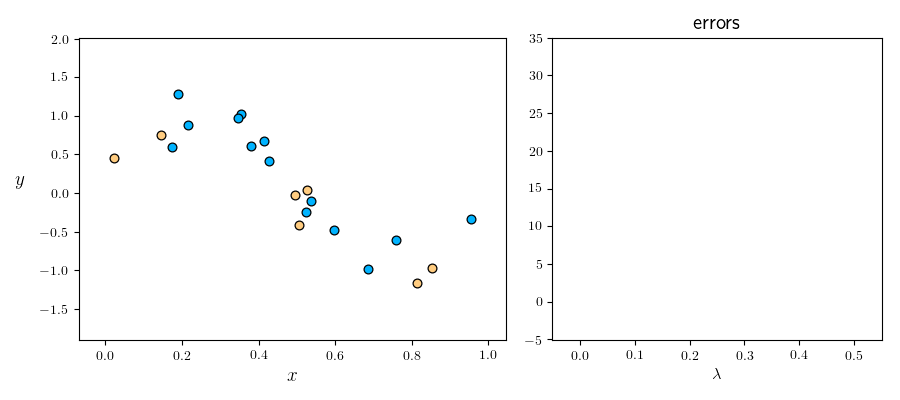
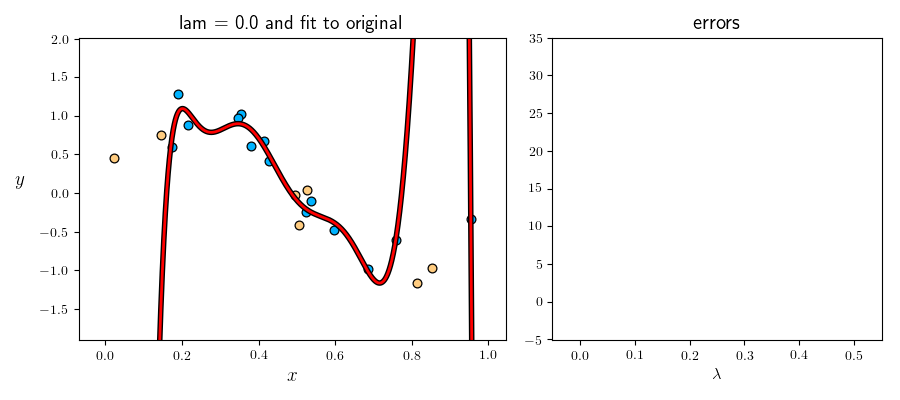
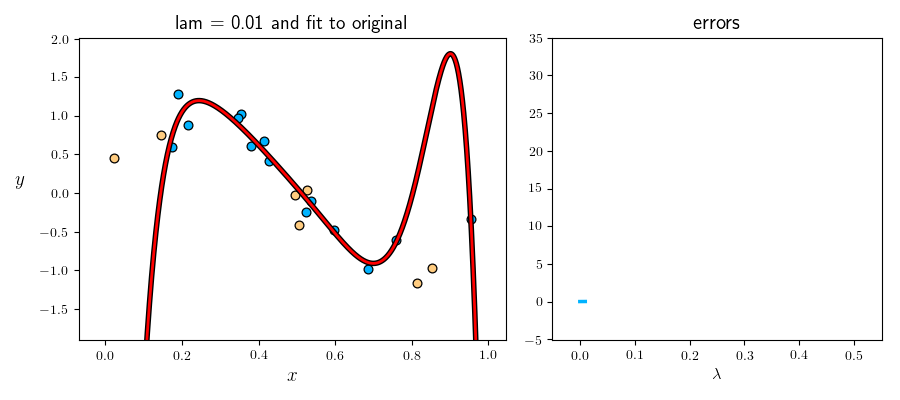
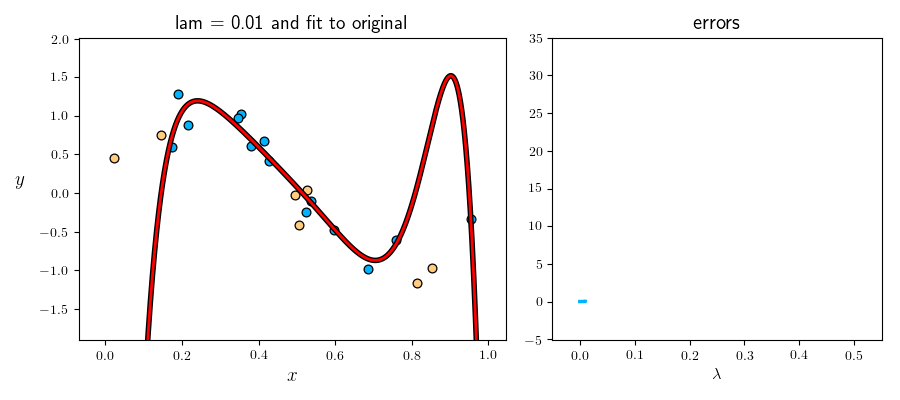
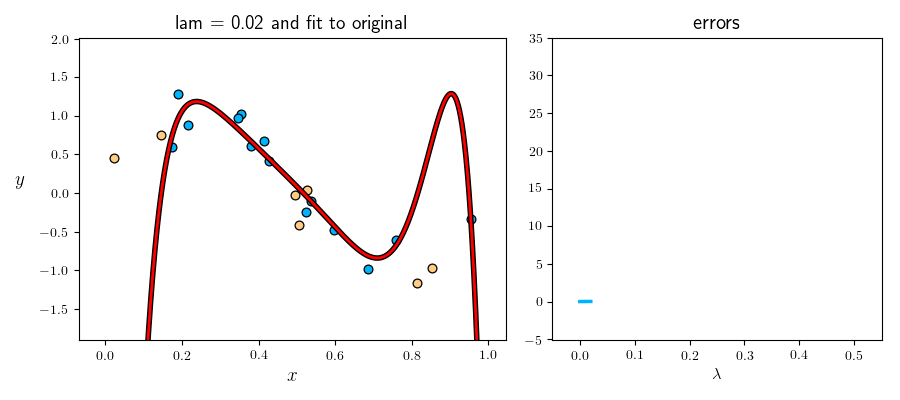
...
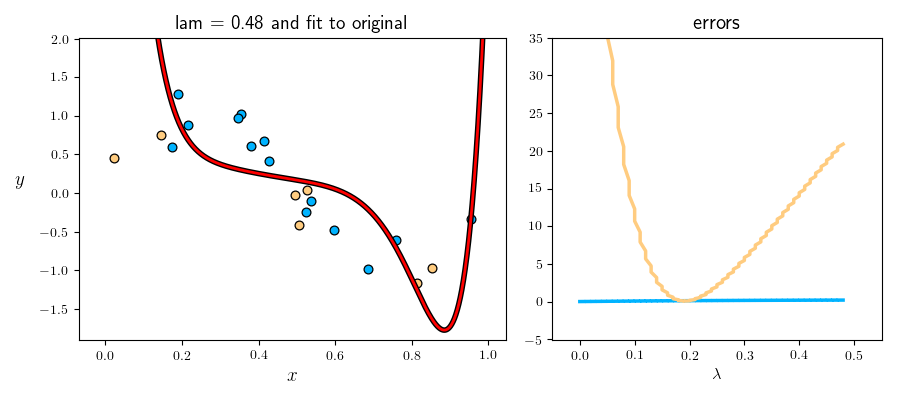
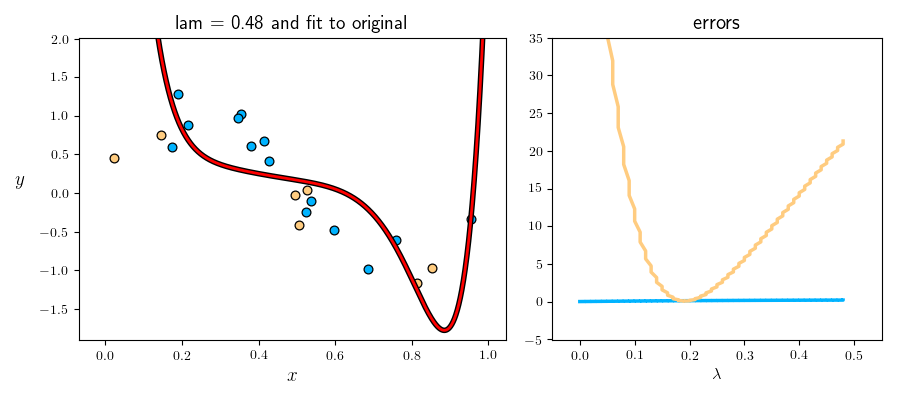
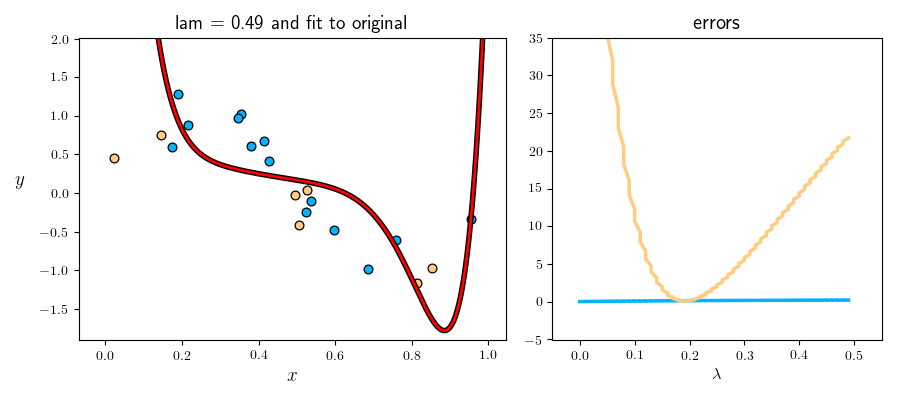
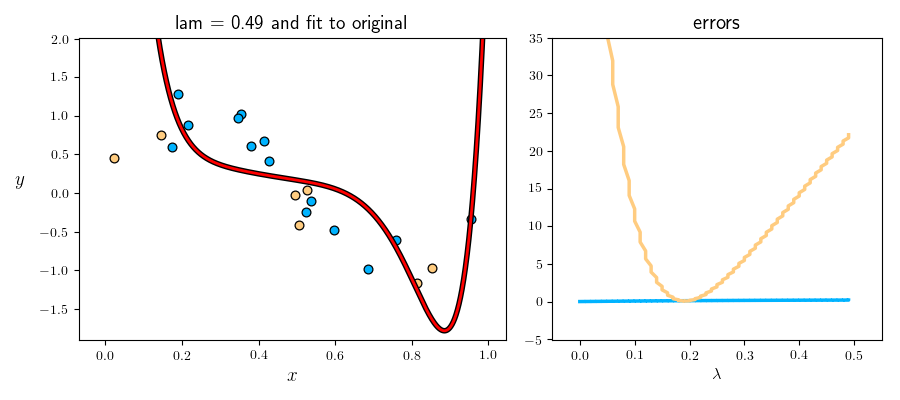
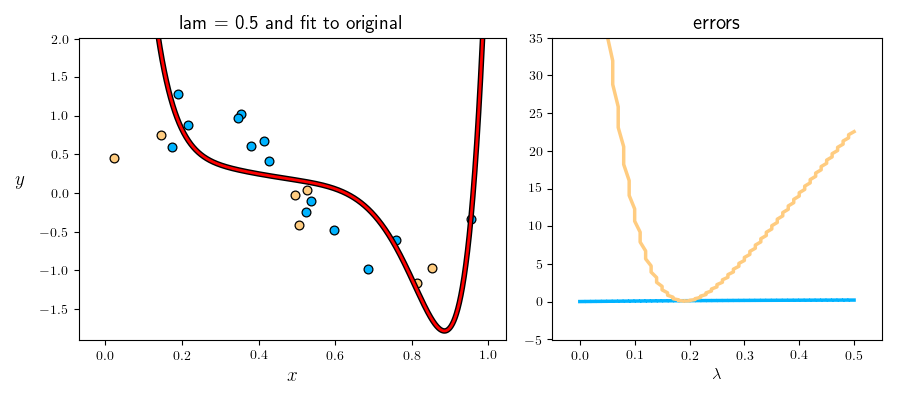

In [90]:
# This code cell will not be shown in the HTML version of this notebook
# load in dataset
csvname = datapath + 'noisy_sin_sample.csv'
data = np.loadtxt(csvname,delimiter = ',')
x = data[:-1,:]
y = data[-1:,:] 

# start process
num_units = 100
degree = 8
train_portion = 0.66
lambdas = np.logspace(-1,1,num_units)
lambdas = np.hstack((0,lambdas))

# lambdas = np.logspace(-10,np.exp(0),num_units)
# lambdas = np.hstack((0,lambdas))


lambdas = np.linspace(0,0.5,num_units)

runs1 = []
w = 0
for j in range(num_units):
    lam = lambdas[j]
    
    # initialize with input/output data
    mylib1 = nonlib.reg_lib.super_setup.Setup(x,y)

    # perform preprocessing step(s) - especially input normalization
    mylib1.preprocessing_steps(normalizer = 'standard')

    # split into training and validation sets
    if j == 0:
        # make training testing split
        mylib1.make_train_val_split(train_portion = train_portion)
        train_inds = mylib1.train_inds
        valid_inds = mylib1.valid_inds

    else: # use split from first run for all further runs
        mylib1.x_train = mylib1.x[:,train_inds]
        mylib1.y_train = mylib1.y[:,train_inds]
        mylib1.x_valid = mylib1.x[:,valid_inds]
        mylib1.y_valid = mylib1.y[:,valid_inds]
        mylib1.train_inds = train_inds
        mylib1.valid_inds = valid_inds
        mylib1.train_portion = train_portion

    # choose cost
    mylib1.choose_cost(name = 'least_squares')

    # choose dimensions of fully connected multilayer perceptron layers
    mylib1.choose_features(name = 'polys',degree = degree)
    
    if j == 0:
        # fit an optimization
        mylib1.fit(algo = 'newtons_method',max_its = 1,verbose = False,lam = lam)
    else:
        mylib1.fit(algo = 'newtons_method',max_its = 1,verbose = False,lam = lam,w=w)

    # add model to list
    runs1.append(copy.deepcopy(mylib1))
    w = mylib1.w_init
    
# animate the business
frames = 100
demo1 = nonlib.regularization_regression_animators.Visualizer(csvname)
demo1.animate_trainval_regularization(runs1,frames,num_units,show_history = True)

#### <span style="color:#a50e3e;">Example 2. </span>  Tuning the parameter of a quadratic regularized two-class classification

In this example we use a quadratic regularizer to fit a proper nonlinear classification to the prototypical regression dataset shown in the left panel below.  Here the training set is shown with their perimeter colored in light blue, and the validation points have their perimeter colored yellow.  We use a high capacity model (with respect to this data) - here a $B = 20$ single hidden layer $text{tanh}$ elements - and use $30$ values of $\lambda$ between $0$ and $0.3$ (completely minimizing the corresponding regularized cost in each instance).  As the slider is moved from left to right the fit provided by the weights recovered from the global minimum of each regularized cost function is shown in red in the left panel, while the corresponding training and validation errors are shown in blue and yellow respectively in the right panel.  In this simple experiment, a value somewhere around $\lambda \approx 0.1$ appears to provide the lowest validation error and corresponding best fit to the dataset overall.


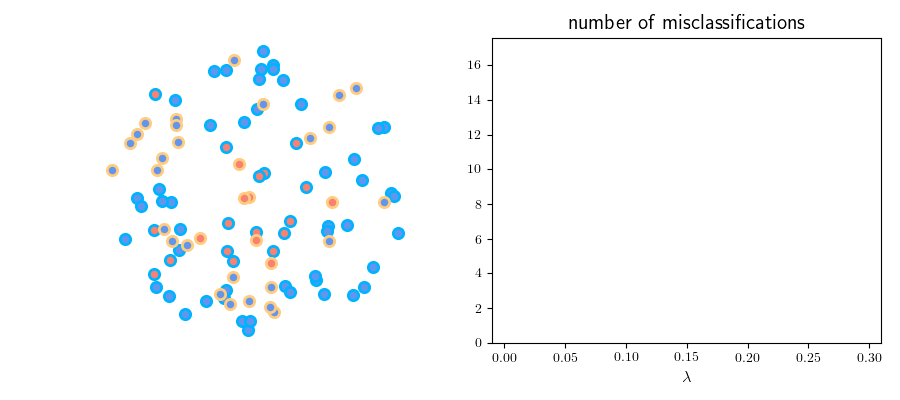
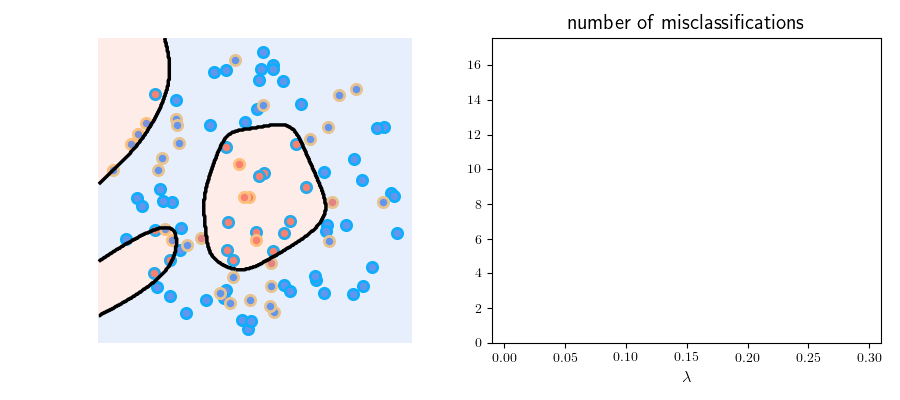
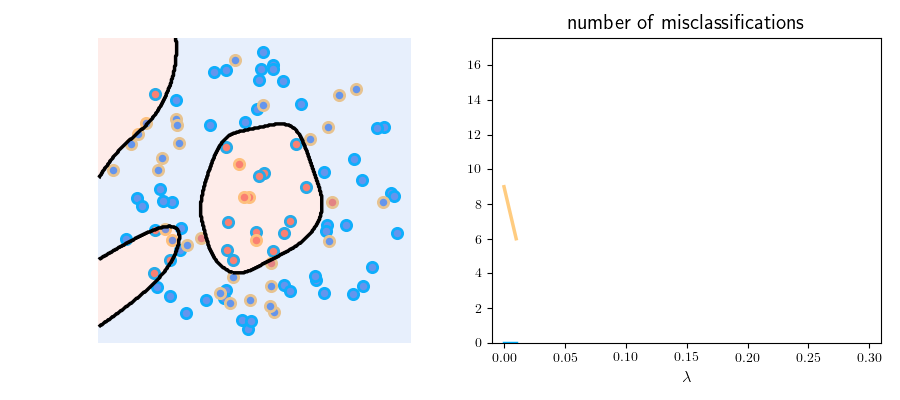
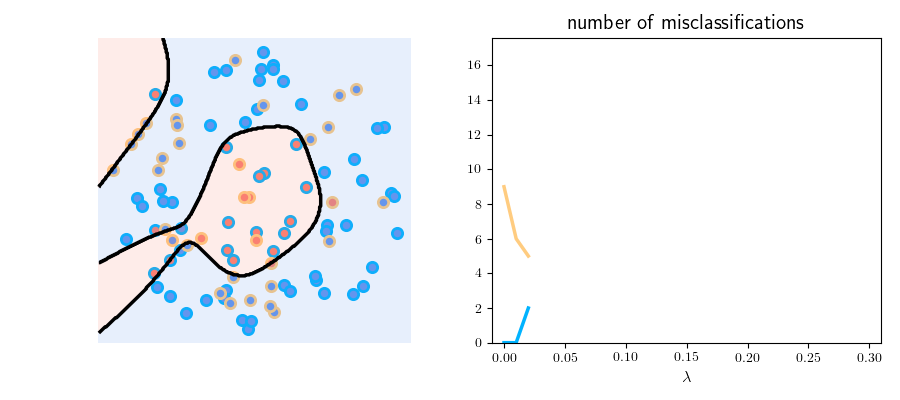
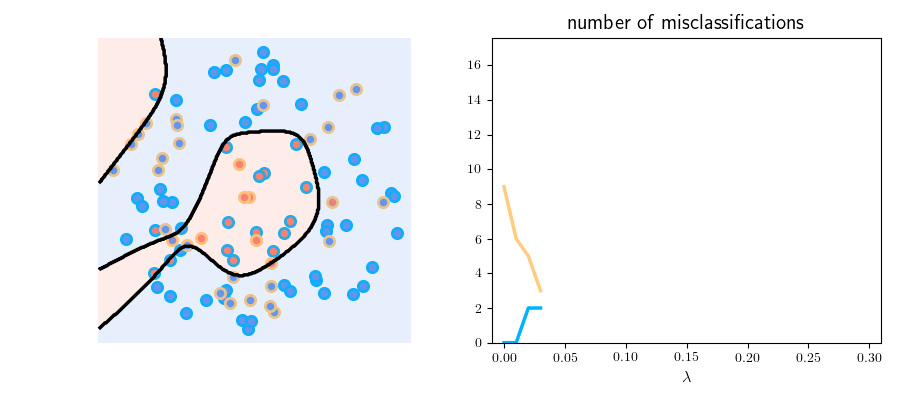
...
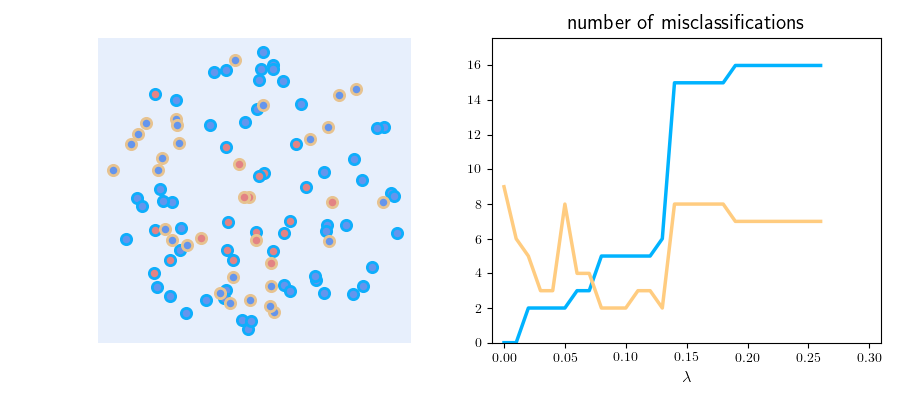
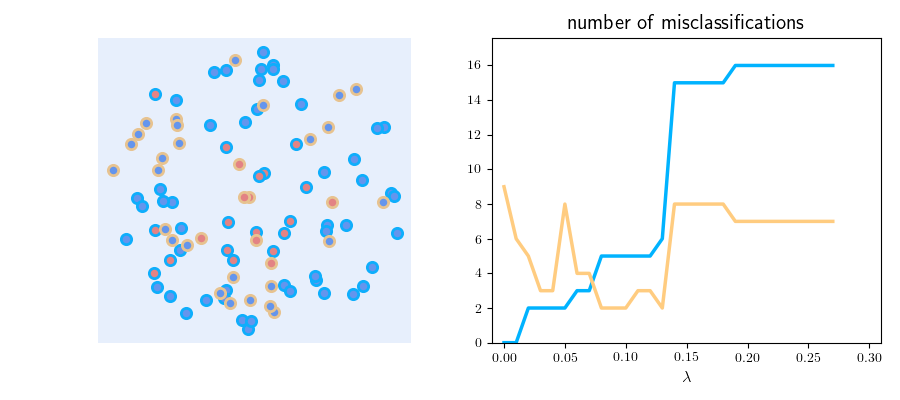
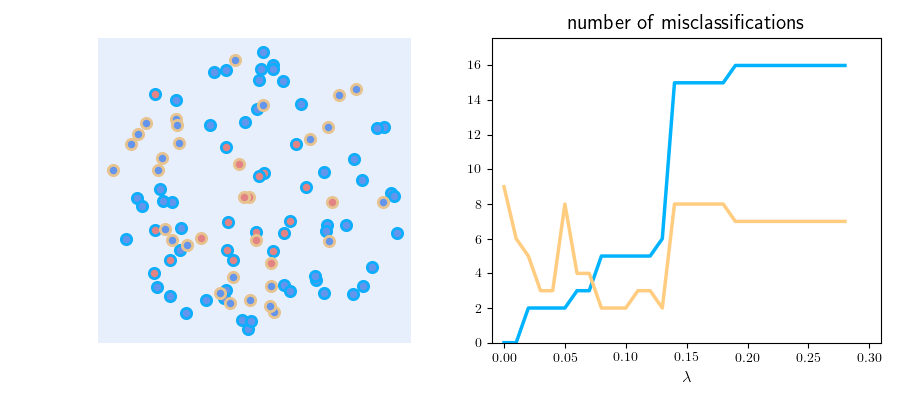
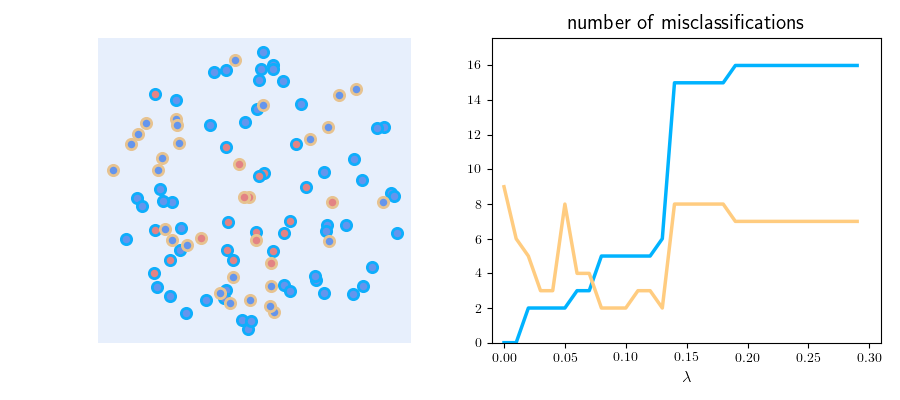
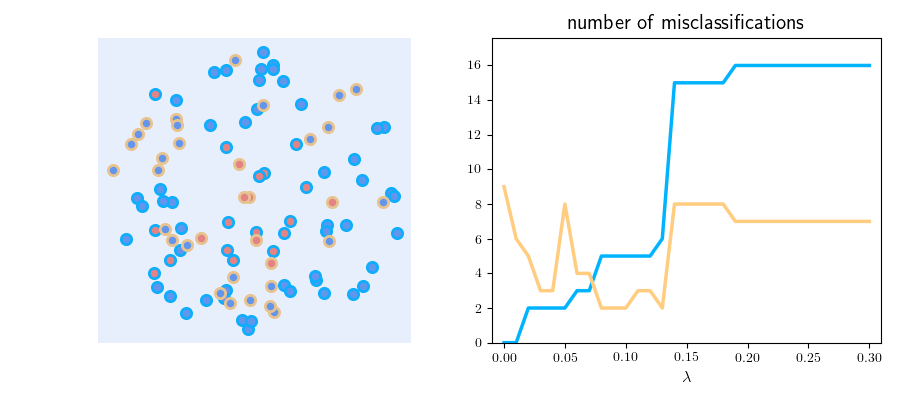

In [237]:
# This code cell will not be shown in the HTML version of this notebook
# load in dataset
csvname = datapath + 'new_circle_data.csv'
data = np.loadtxt(csvname,delimiter = ',')
x = data[:-1,:]
y = data[-1:,:] 

# start process
num_units = 30
train_portion = 0.66
lambdas = np.linspace(0,0.3,num_units)

runs2 = []
w = 0
for j in range(num_units):
    lam = lambdas[j]
    
    # initialize with input/output data
    mylib2 = nonlib.reg_lib.super_setup.Setup(x,y)

    # perform preprocessing step(s) - especially input normalization
    mylib2.preprocessing_steps(name = 'standard')

    # split into training and validation sets
    if j == 0:
        # make training testing split
        mylib2.make_train_val_split(train_portion = train_portion)
        train_inds = mylib2.train_inds
        valid_inds = mylib2.valid_inds
        
#         mylib2.valid_inds = valid_inds
#         mylib2.train_inds = train_inds
#         mylib2.x_train = mylib2.x[:,train_inds]
#         mylib2.y_train = mylib2.y[:,train_inds]
#         mylib2.x_valid = mylib2.x[:,valid_inds]
#         mylib2.y_valid = mylib2.y[:,valid_inds]
        
    else: # use split from first run for all further runs
        mylib2.x_train = mylib2.x[:,train_inds]
        mylib2.y_train = mylib2.y[:,train_inds]
        mylib2.x_valid = mylib2.x[:,valid_inds]
        mylib2.y_valid = mylib2.y[:,valid_inds]
        mylib2.train_inds = train_inds
        mylib2.valid_inds = valid_inds
        mylib2.train_portion = train_portion

    # choose cost
    mylib2.choose_cost(name = 'softmax')

    # choose dimensions of fully connected multilayer perceptron layers
    mylib2.choose_features(name = 'multilayer_perceptron',layer_sizes = [20],activation = 'tanh',scale = 0.1)
    
    if j == 0:
        # fit an optimization
        mylib2.fit(algo = 'gradient_descent',max_its = 2000,verbose = False,lam = lam,alpha_choice = 10**(0))
    else:
        mylib2.fit(algo = 'gradient_descent',max_its = 2000,verbose = False,lam = lam,w=w,alpha_choice = 10**(0))

    # add model to list
    runs2.append(copy.deepcopy(mylib2))
    w = mylib2.w_init
    
# animate the business
frames = 30
demo2 = nonlib.regularization_classification_animator.Visualizer(csvname)
demo2.animate_trainval_regularization(runs2,frames,num_units,show_history = True)

## 11.3.4  Similarity to regularization for feature selection

Akin to the boosting procedure detailed in the previous Section,  here the careful reader will notice how similar the regularization framework described here is to the concept of regularization detailed for feature selection in Section 9.6.  The two approaches are almost entirely the same, except here we do not select from a set of given input features but *create them ourselves based on a universal approximator*.  Additionally here instead of our main concern with regularization being *human interpretability* of a machine learning model, as it was in Section 9.6, here we use regularization as a tool for cross-validation.  The two use-cases for regularization can occur together in principle, however it is generally quite challenging for humans to interpret kernel and neural network universal approximators (the kind most generally used with regularization).  